In [50]:
import os
import numpy as np
from PIL import Image
import astra
import json
import SimpleITK as sitk
import matplotlib.pyplot as plt
from PythonTools.raw2py import raw2py
from PythonTools.py2rek import py2rek
import SimpleITK as sitk
import numpy as np
import matplotlib.pyplot as plt


def load_tiff_images(folder_path):
    """Load CT TIFF images and corresponding JSON metadata."""
    tiff_files = sorted([f for f in os.listdir(folder_path) if f.endswith('.tiff') or f.endswith('.tif')])
    images = np.zeros((2200, 200, 700))
    I0 = 46427
    i = 0
    all_data = []
    for tiff_file in tiff_files:
        tiff_file_path = os.path.join(folder_path, tiff_file)
        image = Image.open(tiff_file_path)
        image_array = np.array(image)
        image_array = np.log(I0/image_array)
        images[:, i, :] = image_array
        i += 1
        json_file_path = tiff_file_path.replace(".tif", ".json")
        with open(json_file_path, 'r') as json_file:
            data = json.load(json_file)
            focal_spot_position_mm = np.array(data.get("focal_spot_position_mm"))
            detector_center_position_mm = np.array(data.get("detector_center_position_mm"))
            detector_center_orientation_matrix = np.array(data.get("detector_center_orientation_matrix"))
            pixel_pitch_mm = np.array(data.get("pixel_pitch_mm"))
            focal_spot_position_um = focal_spot_position_mm * 1000
            detector_center_position_um = detector_center_position_mm * 1000
            pixel_pitch_um = pixel_pitch_mm * 1000
            Detector_row_direction = detector_center_orientation_matrix[:,0] * pixel_pitch_um[0]
            Detector_column_direction = detector_center_orientation_matrix[:,1] * pixel_pitch_um[1]
            cone_vec=np.array([*focal_spot_position_um, *detector_center_position_um, *Detector_row_direction, *Detector_column_direction])
            all_data.append(cone_vec)
    images_3d = np.stack(images, axis=0)
    all_data = np.array(all_data)
    return images_3d, all_data



In [51]:
def load_paut_image(paut_path):
    """Load PAUT image and extract defect edges."""
    paut_image = sitk.ReadImage(paut_path)
    paut_array = sitk.GetArrayFromImage(paut_image)
    paut_edges = sitk.CannyEdgeDetection(paut_image, lowerThreshold=0.1, upperThreshold=0.3)
    return paut_array, sitk.GetArrayFromImage(paut_edges)

import numpy as np

def paut_guided_update(reconstructed_volume, paut_edges, weight=0.5):
    """
    Apply PAUT edges as a constraint in the reconstruction update step.

    :param reconstructed_volume: A 3D numpy array representing your current reconstruction.
    :param paut_edges: A 3D numpy array of the same shape, representing PAUT edges.
    :param weight: A floating-point factor that controls how much the PAUT edges influence
                   the updated reconstruction. (0.0 means no influence, 1.0 means fully replaced)
    :return: A 3D numpy array with the updated reconstruction.
    """
    # Ensure shapes match; if not, resize PAUT edges to match reconstructed_volume
    if paut_edges.shape != reconstructed_volume.shape:
        paut_edges = np.resize(paut_edges, reconstructed_volume.shape)
    
    # Where PAUT edges are positive, blend the reconstruction with the PAUT edges
    reconstruction_updated = np.where(
        paut_edges > 0,
        (1 - weight) * reconstructed_volume + weight * paut_edges,
        reconstructed_volume
    )

    return reconstruction_updated


def save_as_nii(volume, filename='reconstructed_volume.nii'):
    """Save the reconstructed volume as a NIfTI (.nii) file."""
    sitk_volume = sitk.GetImageFromArray(volume)
    sitk.WriteImage(sitk_volume, filename)
    print(f"Reconstructed volume saved as {filename}")


In [52]:
# Load CT and PAUT images
folder_path = r"/home/abtin/CT+Ultrasound/Reconstruction/Steel_aRTist_Data/Steel_aRTist_Data"
paut_path = r"/home/abtin/CT+Ultrasound/Reconstruction/SAFT_NEW_Version_V2.nii"
images_3d_array, cone_vecs = load_tiff_images(folder_path)
paut_array, paut_edges_array = load_paut_image(paut_path)


CT_data = sitk.ReadImage("max_fused.nii")
paut = sitk.ReadImage("SAFT_NEW_Version_V2.nii")




In [53]:
def resample_image_to_reference(input_image, reference_image):
    """
    Resample the input_image to match the reference_image's physical space.
    """
    resample = sitk.ResampleImageFilter()
    resample.SetReferenceImage(reference_image)
    resample.SetInterpolator(sitk.sitkLinear)  # Use linear interpolation
    resample.SetDefaultPixelValue(0)  # Value for out-of-bounds pixels
    resample.SetOutputOrigin(reference_image.GetOrigin())
    resample.SetOutputSpacing(reference_image.GetSpacing())
    resample.SetSize(reference_image.GetSize())
    resample.SetOutputDirection(reference_image.GetDirection())
    return resample.Execute(input_image)

# Resample the PAUT image to match the CT image
resampled_paut = resample_image_to_reference(paut, CT_data)
paut_size = resampled_paut.GetSize()
paut_origin = resampled_paut.GetOrigin()
paut_spacing = resampled_paut.GetSpacing()

print(paut_size)
print(paut_origin)
print(paut_spacing)



(384, 1024, 384)
(0.0, 0.0, 0.0)
(1.0, 1.0, 1.0)


In [57]:
paut_array1 = sitk.GetArrayFromImage(resampled_paut)
paut_edges = sitk.CannyEdgeDetection(resampled_paut, lowerThreshold=0.1, upperThreshold=0.3)
paut_edges_arr = sitk.GetArrayFromImage(paut_edges)

In [58]:
# Define reconstruction parameters
num_projections = images_3d_array.shape[1]
detector_pixel_x = images_3d_array.shape[2]
detector_pixel_y = images_3d_array.shape[0]
n_rows, n_cols, n_slices = 384, 1024, 384
volume_voxel_size_um = 139 * 2
volume_center_position_um = [0,0,200000]
min_x, max_x = volume_center_position_um[0] - n_rows/2 * volume_voxel_size_um, volume_center_position_um[0] + n_rows/2 * volume_voxel_size_um
min_y, max_y = volume_center_position_um[1] - n_cols/2 * volume_voxel_size_um, volume_center_position_um[1] + n_cols/2 * volume_voxel_size_um
min_z, max_z = volume_center_position_um[2] - n_slices/2 * volume_voxel_size_um, volume_center_position_um[2] + n_slices/2 * volume_voxel_size_um

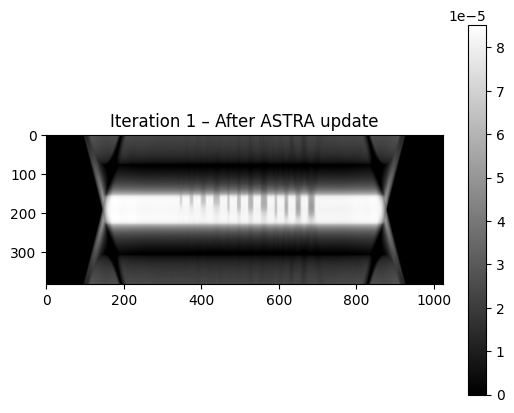

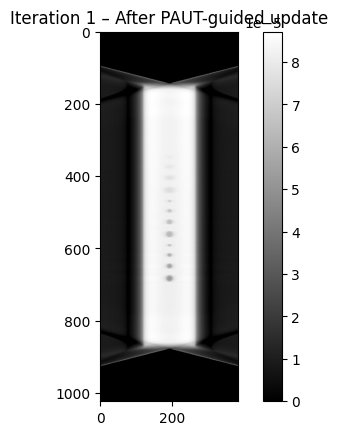

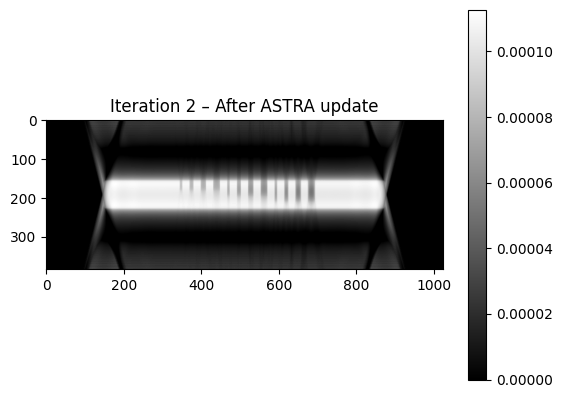

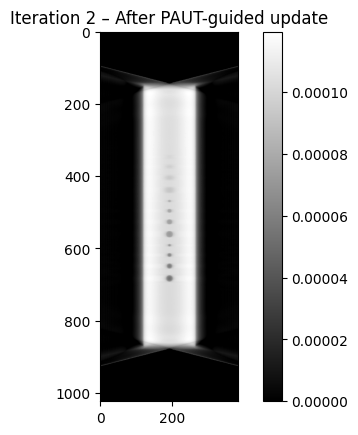

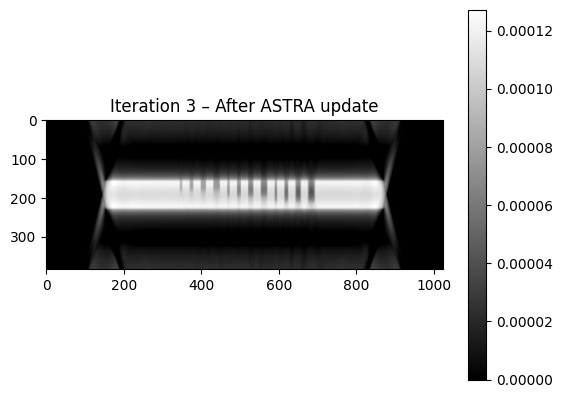

...

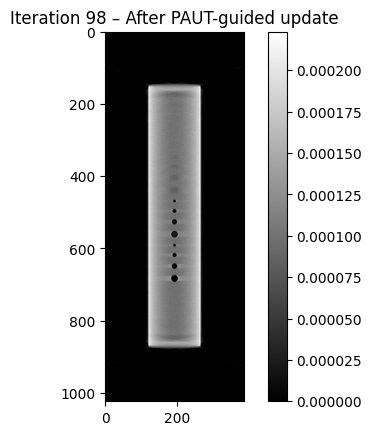

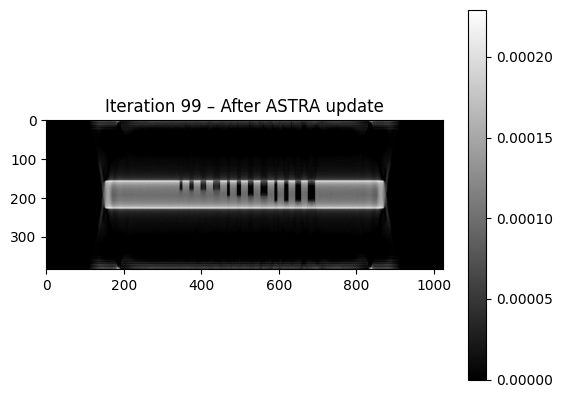

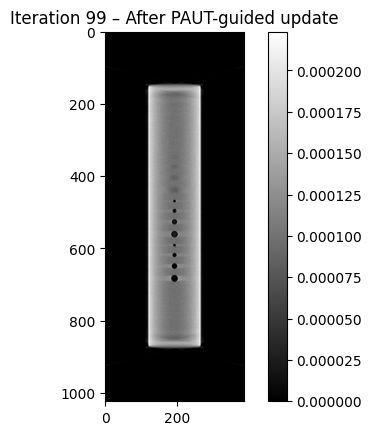

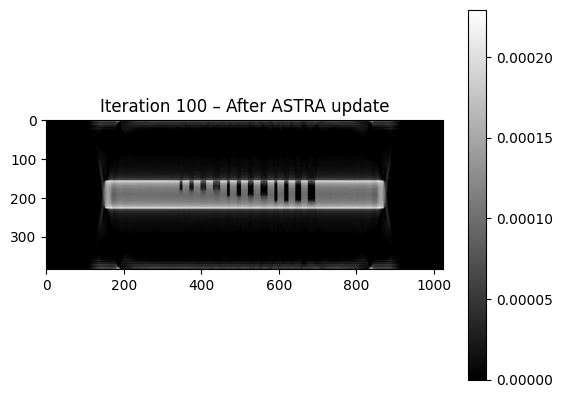

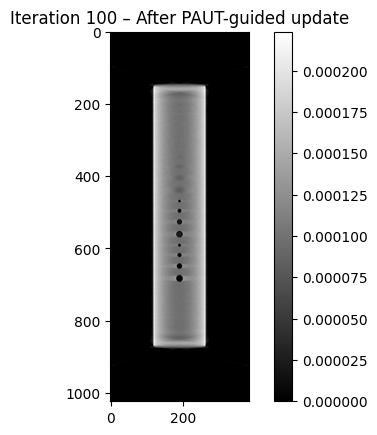

Reconstructed volume saved as paut_guided_reconstructed_V2.nii
Hybrid PAUT-Guided Reconstruction complete. Volume shape: (384, 1024, 384)


In [61]:
import matplotlib.pyplot as plt

# Create and configure your volumes, projections, etc. as before:
vol_geom = astra.create_vol_geom(n_cols, n_rows, n_slices, min_x, max_x, min_y, max_y, min_z, max_z)
proj_geom = astra.create_proj_geom('cone_vec', detector_pixel_y, detector_pixel_x, cone_vecs)
proj_id = astra.data3d.create('-sino', proj_geom, images_3d_array)
reconstruction_id = astra.data3d.create('-vol', vol_geom)

cfg = astra.astra_dict('SIRT3D_CUDA')
cfg['ProjectionDataId'] = proj_id
cfg['ReconstructionDataId'] = reconstruction_id
cfg['option'] = {'MinConstraint': 0}

algo_id = astra.algorithm.create(cfg)

# Run multiple iterations and visualize
num_iterations = 100  # or 100, but 5 here just so it won't spam too many plots
for i in range(num_iterations):
    # Run 1 sub-iteration of the ASTRA reconstruction
    astra.algorithm.run(algo_id, 5)
    
    # 1) Get the volume right after ASTRA update
    reconstructed_volume = astra.data3d.get(reconstruction_id)

    # Visualize the result (middle slice in the z-dimension)
    mid_z = reconstructed_volume.shape[2] // 2
    plt.figure()
    plt.imshow(reconstructed_volume[:, :, mid_z], cmap='gray')
    plt.title(f"Iteration {i+1} – After ASTRA update")
    plt.colorbar()
    plt.show()

    # 2) Apply PAUT-guided update
    reconstructed_volume = paut_guided_update(reconstructed_volume, paut_edges_arr, weight=0.7)
    
    # Visualize the result after paut_guided_update
    plt.figure()
    plt.imshow(reconstructed_volume[mid_z, :, :], cmap='gray')
    plt.title(f"Iteration {i+1} – After PAUT-guided update")
    plt.colorbar()
    plt.show()
    
    # Store back into ASTRA so the next iteration starts from this updated volume
    astra.data3d.store(reconstruction_id, reconstructed_volume)

# Clean up
astra.algorithm.delete(algo_id)
astra.data3d.delete(reconstruction_id)
astra.data3d.delete(proj_id)

# Save final output
save_as_nii(reconstructed_volume, 'paut_guided_reconstructed_V2.nii')
print("Hybrid PAUT-Guided Reconstruction complete. Volume shape:", reconstructed_volume.shape)


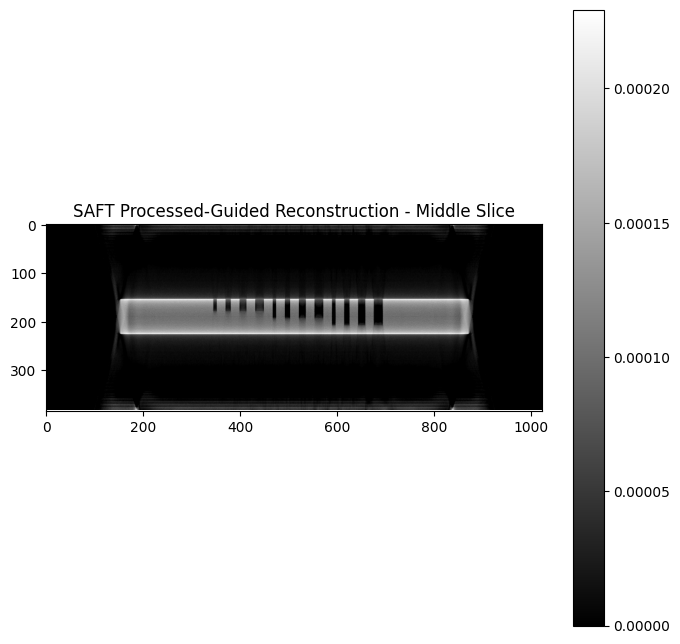

In [62]:
def display_middle_slice(volume, title='Middle Slice'):
    """Display the middle slice of a 3D volume."""
    mid_slice_index = volume.shape[2] // 2  # Middle slice along the Y-axis
    plt.figure(figsize=(8, 8))
    plt.imshow(volume[:, :, mid_slice_index], cmap='gray')
    plt.title(title)
    plt.colorbar()
    plt.show()

display_middle_slice(reconstructed_volume, title="SAFT Processed-Guided Reconstruction - Middle Slice")


In [63]:
def save_as_nii(volume, filename='reconstructed_volume.nii'):
    """Save the reconstructed volume as a NIfTI (.nii) file."""
    sitk_volume = sitk.GetImageFromArray(volume)
    sitk.WriteImage(sitk_volume, filename)
    print(f"Reconstructed volume saved as {filename}")

save_as_nii(reconstructed_volume, 'SAFT_V2_Reconstructed_Edges.nii')


Reconstructed volume saved as SAFT_V2_Reconstructed_Edges.nii
